In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision.models import vgg16
from torchvision import transforms
import cv2

In [3]:
class CenterCrop224(object):
    
    def __init__(self, output_size=224):
        assert isinstance(output_size, int)
        self.output_size = output_size

    def __call__(self, image):
        img = np.array(image)
        h, w = img.shape[:2]
        sz = self.output_size
        
        if h == w: 
            return cv2.resize(img, (sz, sz), cv2.INTER_AREA)
        
        elif h > w:
            scaling_factor = sz / w
            x_shape = sz
            y_shape = int(h * scaling_factor)
            img_reshaped = cv2.resize(img, (x_shape, y_shape), cv2.INTER_AREA)
            offset = int((y_shape - sz) / 2)
            img_reshaped = img_reshaped[offset:offset + sz, :, :]
            
        else :
            scaling_factor = sz / h
            x_shape = int(w * scaling_factor) 
            y_shape = sz
            img_reshaped = cv2.resize(img, (x_shape, y_shape), cv2.INTER_AREA)
            offset = int((x_shape - sz) / 2)
            img_reshaped = img_reshaped[:, offset:offset+sz, :]
        return img_reshaped


In [4]:
transform = transforms.Compose([CenterCrop224(), 
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                                        std=[0.229, 0.224, 0.225])])
center_crop = CenterCrop224()

In [5]:
def load_image(path="trench.jpeg"):
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    return img

In [6]:
def print_image(img):
    # print(img.shape[:2])
    plt.imshow(img)

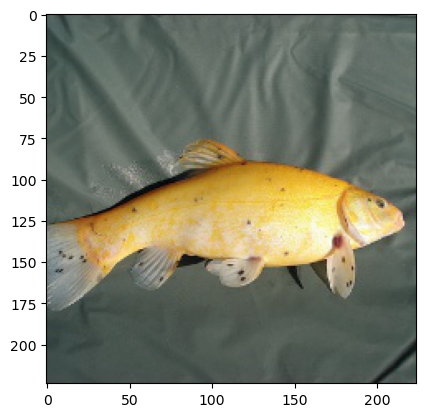

In [7]:
print_image(center_crop(load_image()))

### Conv Network

In [8]:
class ConvVgg16(nn.Module):
    def __init__(self, save_switches=False):
        super().__init__()
        
        self.save_switches = save_switches
        # indices of Conv2d layres
        self.modules_no = []
        
        self.features = vgg16(pretrained=True).features
        
        for i, feature in enumerate(self.features) :
            if isinstance(feature, nn.MaxPool2d):
                self.features[i] = nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False, return_indices = True)
            
            elif isinstance(feature, nn.Conv2d):
                self.modules_no.append(i)
            
        self.avgpool = vgg16(pretrained=True).avgpool
        self.classifier = vgg16(pretrained=True).classifier
                        
        
    def forward (self, x) :
        conv_results = {}
        maxpool_indices = {}
        for i, layer in enumerate(self.features):
            
            if isinstance(layer, nn.MaxPool2d):
                x, index = layer(x)
                maxpool_indices[i] = index
                
            else :
                x = layer(x)
            
            if isinstance(layer, nn.Conv2d):
                conv_results[i] = x
            
        
            
        x = self.avgpool(x)
        x = x.flatten()
        x = self.classifier(x)
        
        
        if not self.save_switches :
            return x    
            
        return x, conv_results, maxpool_indices
    

### Deconv

In [19]:
class ConvDeconvVGG16(nn.Module) :
    def __init__(self) :
        
        super().__init__()
        
        
        self.conv_model = ConvVgg16(save_switches=True)
        
        self.conv_indices = []
        self.maxpool_indices = []
        
        module_list = []
        
        for i, layer in enumerate(self.conv_model.features) :
            if isinstance(layer, nn.Conv2d):
                module_list.append(nn.ConvTranspose2d(layer.out_channels, layer.in_channels, layer.kernel_size, stride=layer.stride, padding=layer.padding))
                module_list[i].weight.data = layer.weight.data
                self.conv_indices.append(i)
                
            elif isinstance(layer, nn.MaxPool2d):
                module_list.append(nn.MaxUnpool2d(kernel_size=2, stride=2))
                self.maxpool_indices.append(i)
                
            elif isinstance(layer, nn.ReLU):
                module_list.append(nn.ReLU(inplace=True))
        
        module_list.reverse()
        self.module_list = nn.ModuleList(module_list)
        
    def forward(self, x, layer_ix) :
        
        conv_pred_vector, conv_results, switches  = self.conv_model(x)
        conv_pred = conv_pred_vector.argmax().item()
        
        y = conv_results[self.conv_indices[layer_ix]]
        
        # y_max_values, y_indices = torch.topk(y.flatten(), 9) # Top 9 activations

        # y_zerod = torch.zeros(9 * y.numel()).reshape(9, y.numel())
        # for i in range(9):
        #     y_zerod[i, y_indices[i]] = y_max_values[i]
        
        # y = y_zerod.reshape(9, y.shape[0], y.shape[1], y.shape[2])
        # # print(y.shape)

        y_idx = y.argmax().item() 
        y_max = y.max().item()
        y_zerod = torch.zeros_like(y).flatten()
        y_zerod[y_idx] = y_max
        y = y_zerod.reshape(y.shape)         
        
        # for j in range(9):
            
            # out = y[j, :, :, :]

        for i, layer in enumerate(self.module_list[(30 - self.conv_indices[layer_ix]):]) :
            if isinstance(layer, nn.MaxUnpool2d):
                y = layer(y, switches[self.conv_indices[layer_ix] - i])
            else :
                y = layer(y)
        
        # y[j, :, :, :] = out


        ret = {"pred_prob" : conv_pred_vector, "pred" : conv_pred, "conv_results": conv_results,"deconv" : y}
        return ret

In [20]:
model = ConvDeconvVGG16()

/home/shikhar/miniconda3/envs/torch-env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/shikhar/miniconda3/envs/torch-env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [21]:
def reconstruction(img):

    reconstructed_img = np.zeros((6, 224, 224, 3), dtype=np.int32)

    for i, layer_i in enumerate(model.conv_indices):

        if i > 5:
            break
        
        out = model(img, layer_i)

        # for j in range(9):

        img_out = out['deconv'].permute(1, 2, 0).detach().cpu().numpy()
        img_out = (img_out - img_out.min()) / (img_out.max() - img_out.min())
        img_out = (img_out * 255).astype(np.uint8)


        # Histogram equalization on img_out
        img_out[:, :, 0] = cv2.equalizeHist(img_out[:, :, 0])
        img_out[:, :, 1] = cv2.equalizeHist(img_out[:, :, 1])
        img_out[:, :, 2] = cv2.equalizeHist(img_out[:, :, 2])

        reconstructed_img[i] = img_out

    return reconstructed_img

In [23]:
# def plot_layer_i(reconstructed_img, layer_i=5):
#     activations_layer_i = reconstructed_img[layer_i,:,:,:,:]

#     fig, axes = plt.subplots(3, 3, figsize=(6, 6))

#     for i in range(9):
        
#         axes[i // 3][i % 3].imshow(activations_layer_i[i, :,:,:])
#         # axes[i // 3][i % 3].set_title(f"Top {i+1} Activation")
#         axes[i // 3][i % 3].axis("off")

#     fig.suptitle(f"Layer {layer_i + 1}")
#     plt.subplots_adjust(wspace=0, hspace=0)
#     plt.show()

In [43]:
def reconstruction_plots(img, name):

    # Original Image
    # plt.imshow(img)
    # plt.title("Input Image")
    # plt.axis("off")
    # plt.show()

    reconstructed_img = reconstruction(transform(img))

    fig, axes = plt.subplots(3, 3, figsize=(14, 12))        

    for i in range(6):
        # plot_layer_i(reconstructed_img, i)

        axes[i // 3][i % 3].imshow(reconstructed_img[i])
        axes[i // 3][i % 3].set_xticklabels([])
        axes[i // 3][i % 3].set_yticklabels([])
        axes[i // 3][i % 3].set_title(f"Layer {i + 1}")

    axes[2][1].imshow(img)
    axes[2][1].set_xticklabels([])
    axes[2][1].set_yticklabels([])
    axes[2][1].set_title("Input Image")
    
    axes[2][0].axis("off")
    axes[2][2].axis("off")

    # plt.subplots_adjust(wspace=0, hspace=0)
    # plt.show()
    fig.savefig(name)

    plt.show()

In [44]:
import os

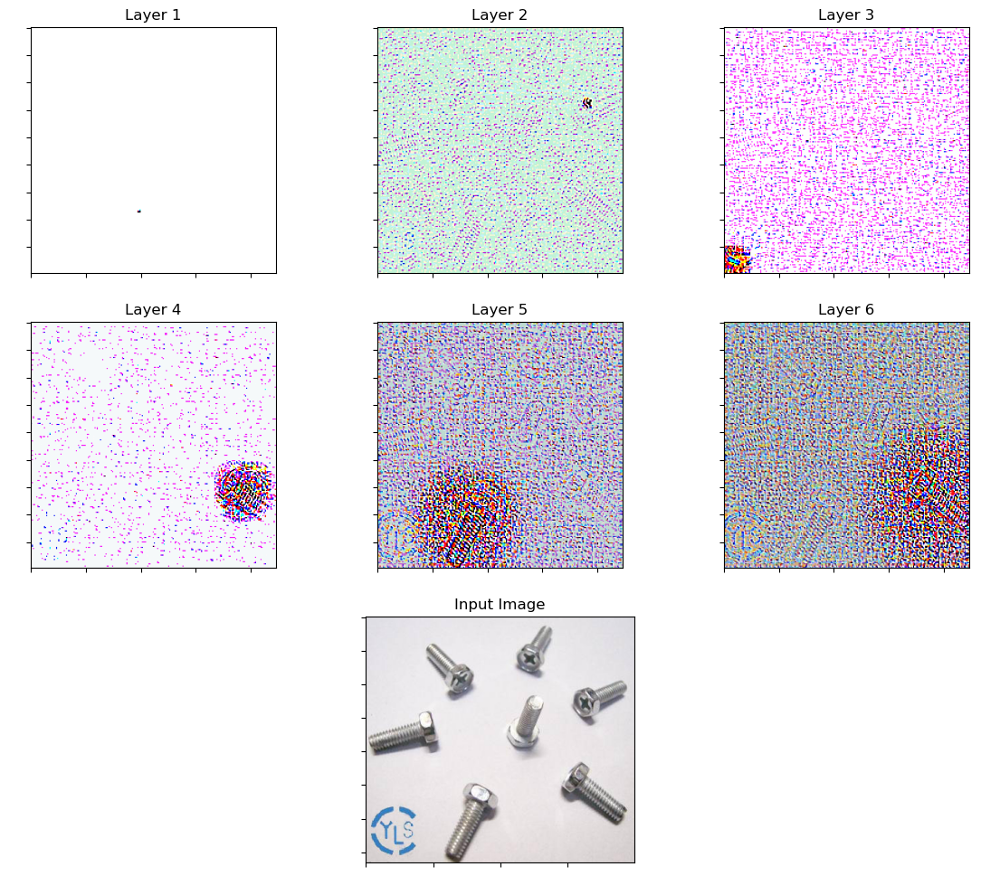

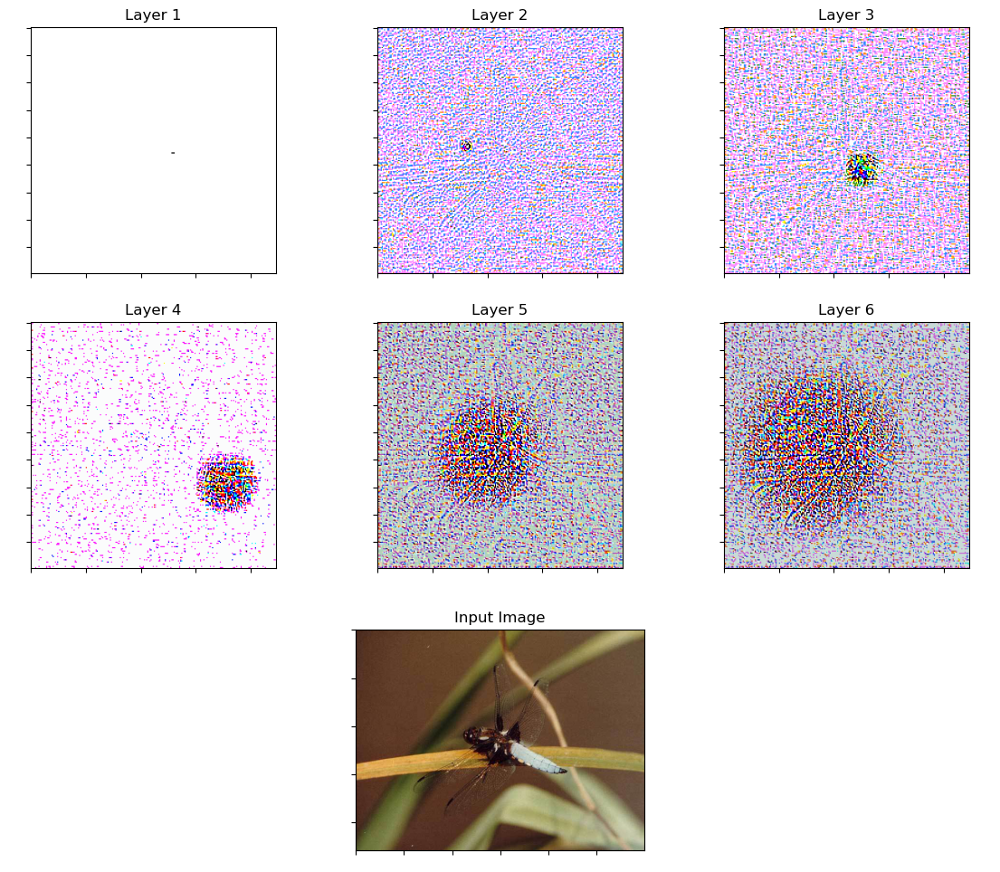

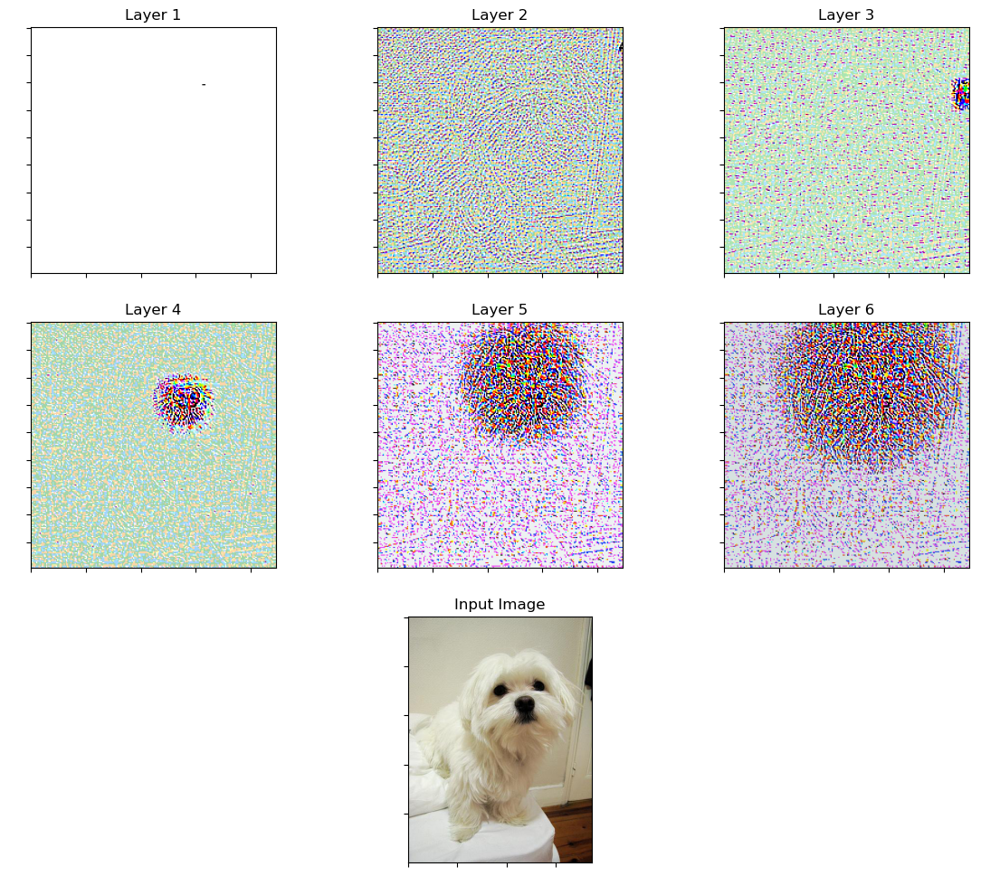

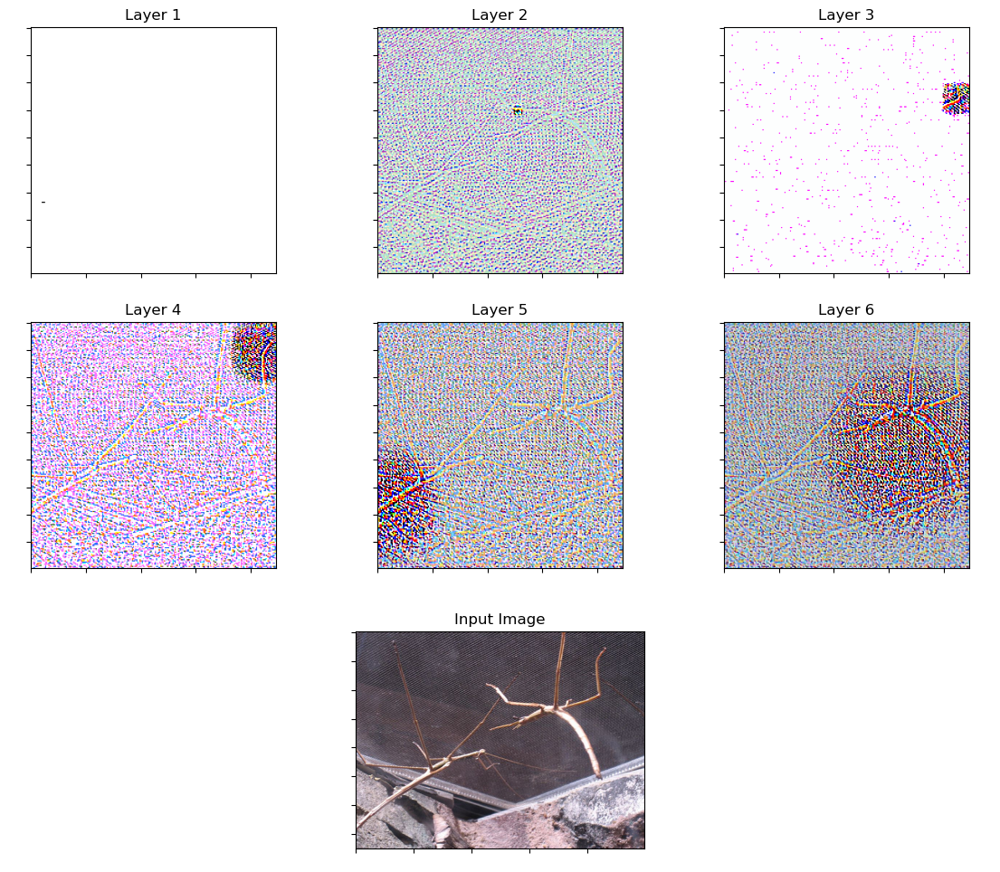

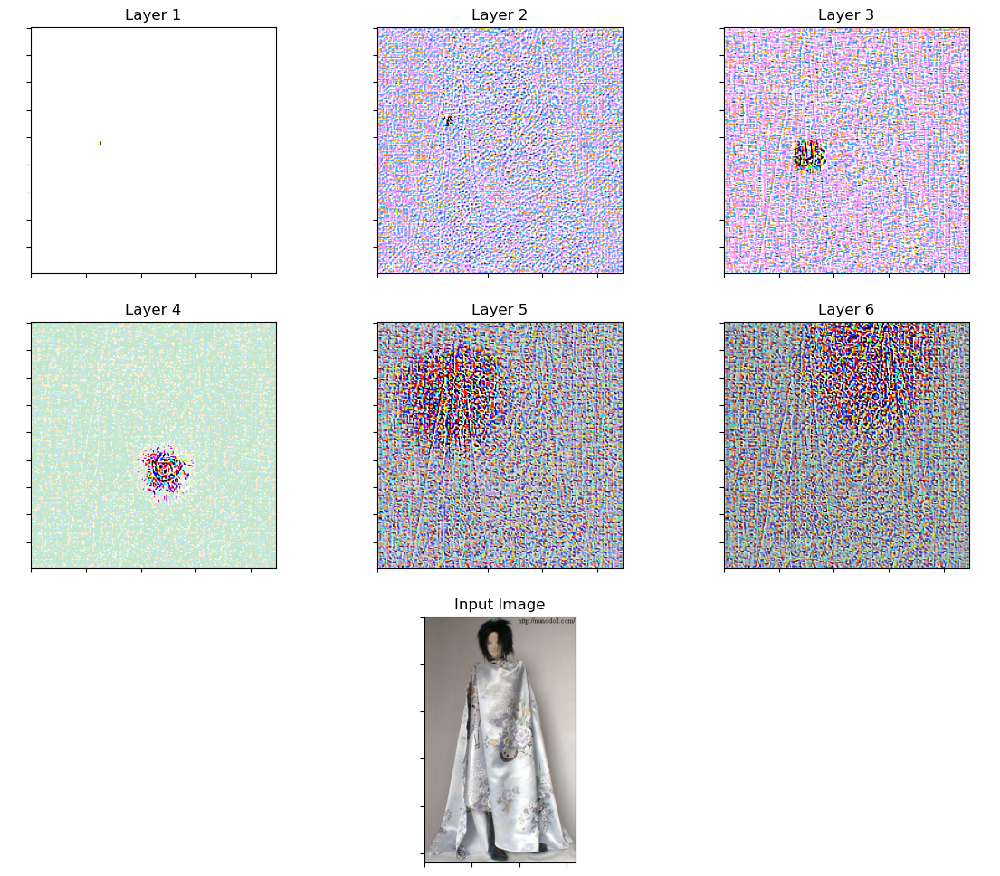

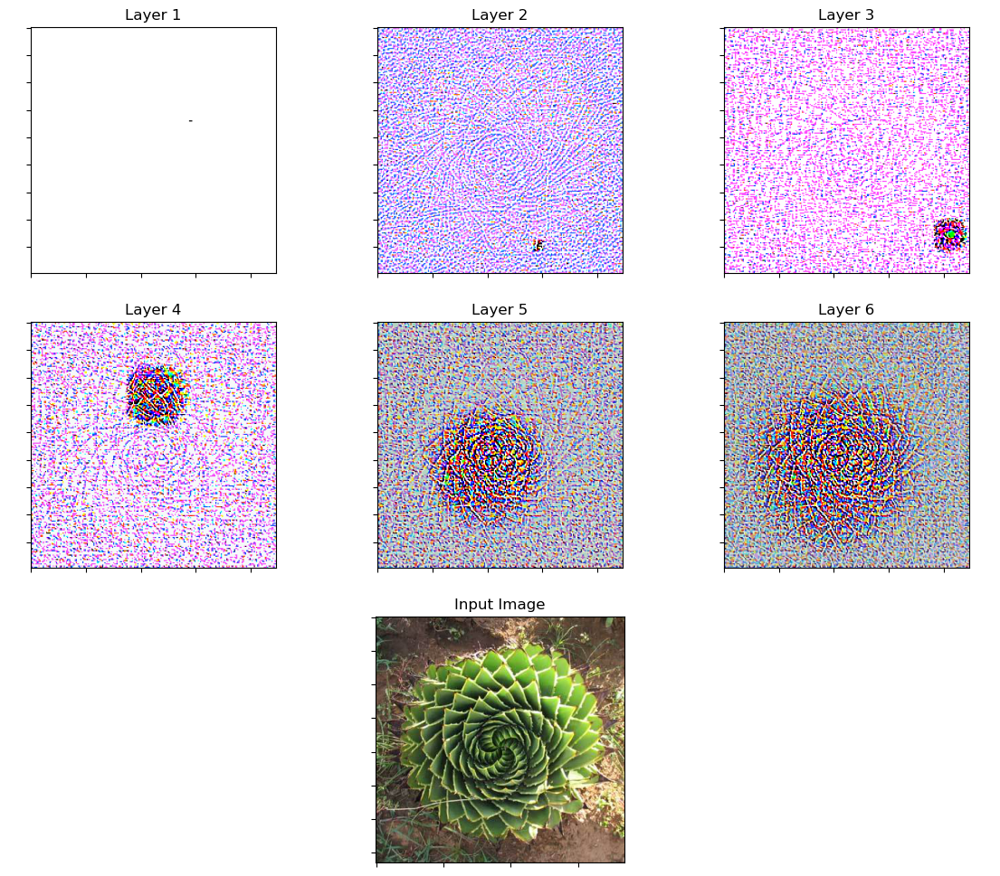

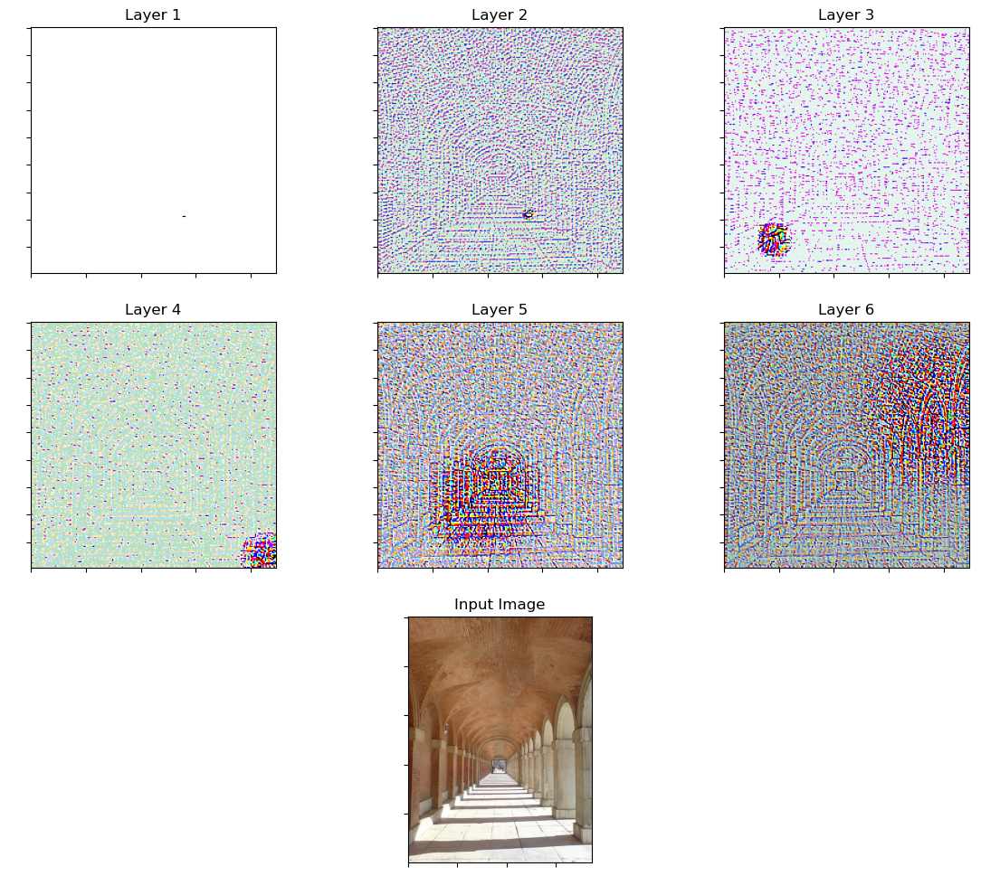

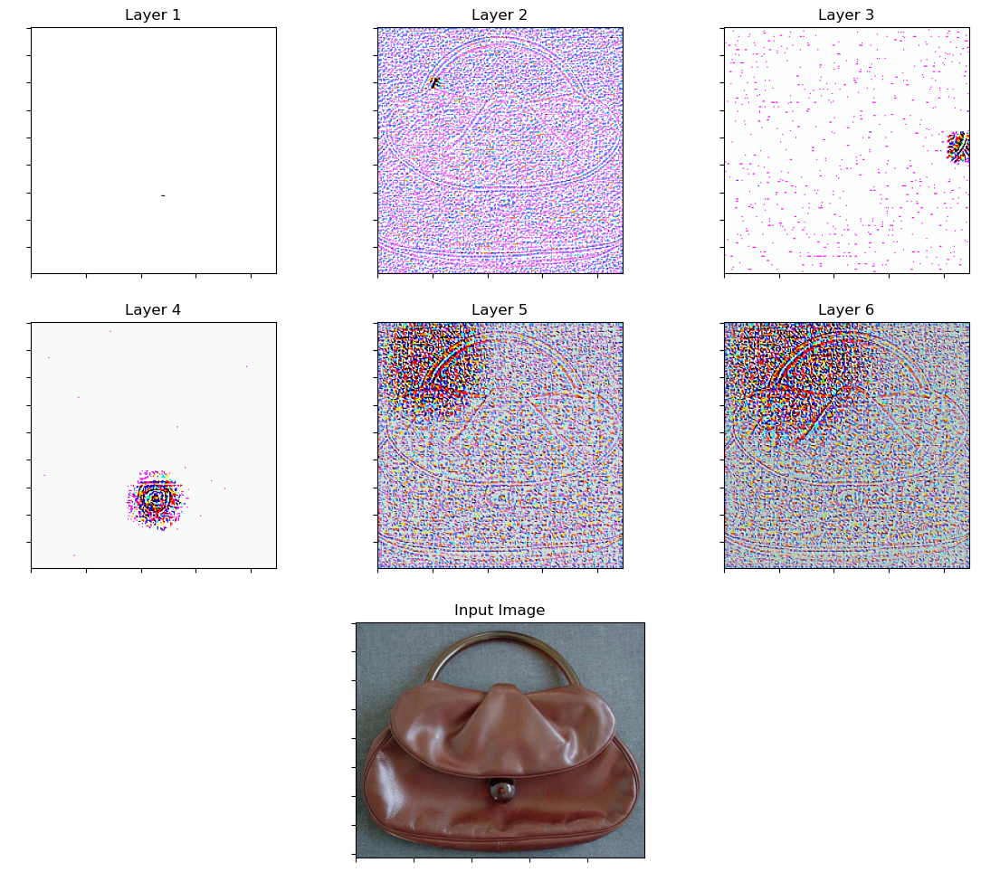

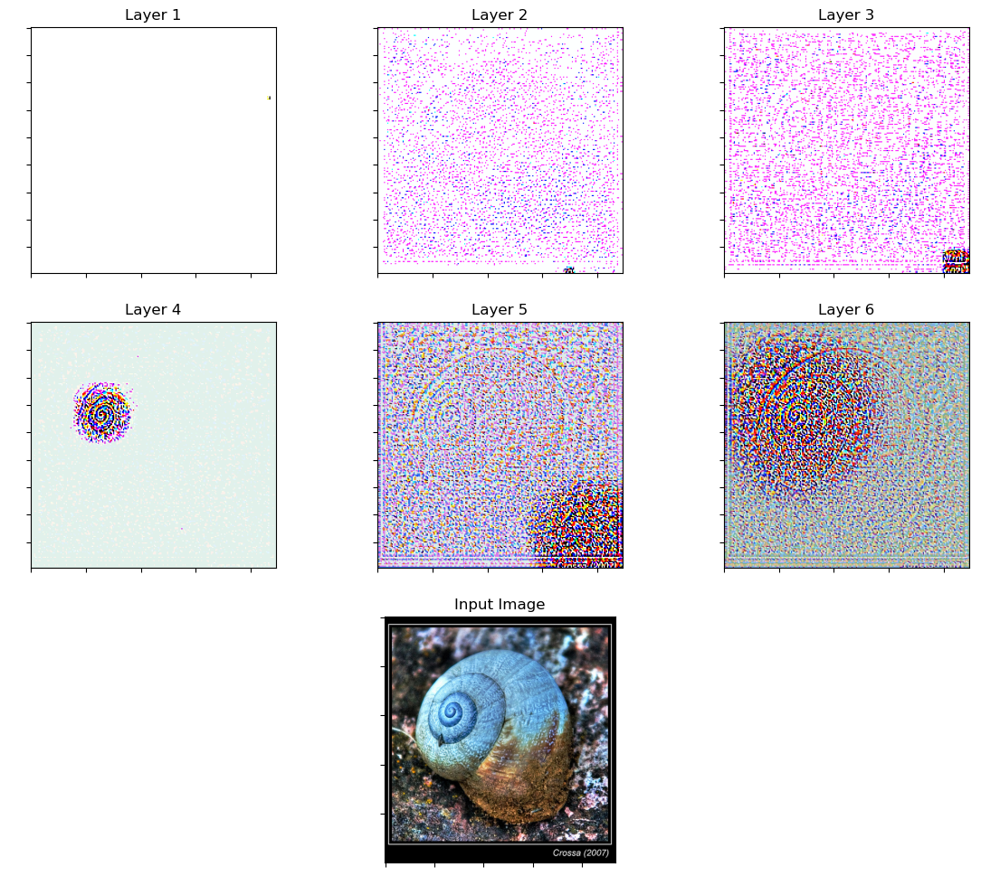

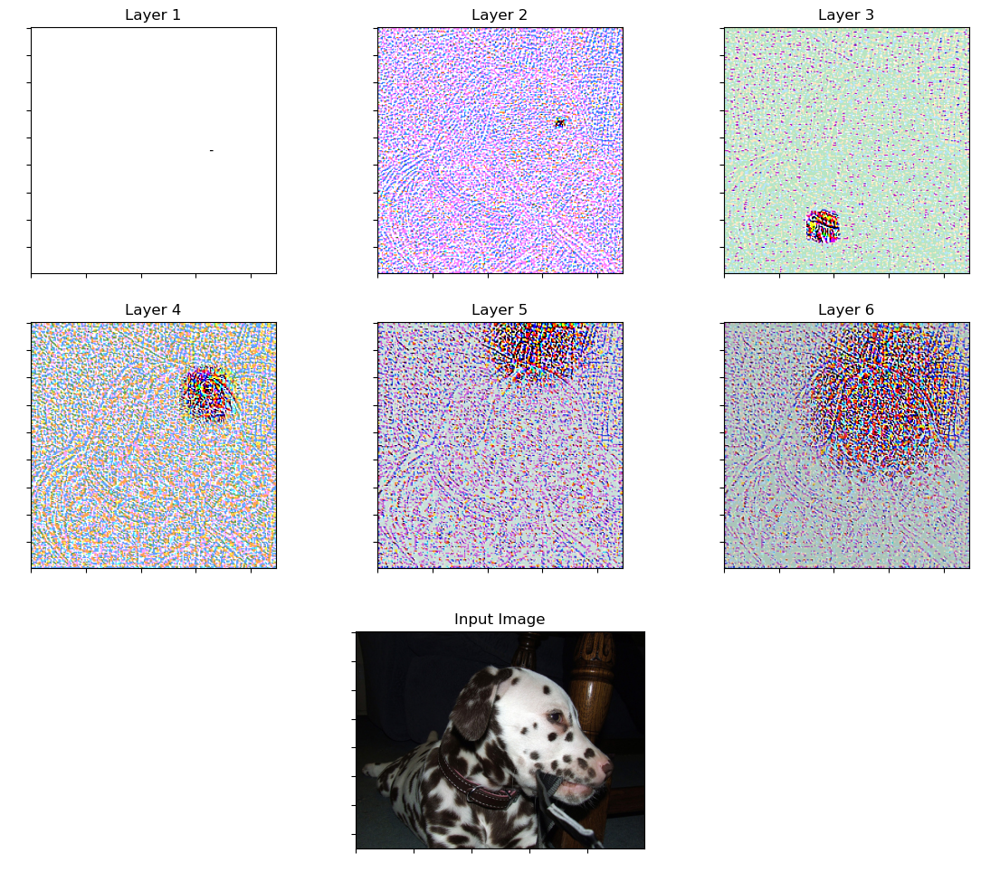

In [45]:
image_dir = "../images/test"

for file in os.listdir(image_dir):
    reconstruction_plots(load_image(os.path.join(image_dir, file)), f"../images/visualized/{file}")